<a href="https://colab.research.google.com/github/ankesh86/InteractDiffusionSmallData/blob/main/AnnotationAnimals.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from PIL import Image
import requests

from transformers import CLIPProcessor, CLIPModel

In [2]:
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [3]:
# %% Load and visualise the images
image_urls = [
    'http://images.cocodataset.org/val2014/COCO_val2014_000000159977.jpg',
    'http://images.cocodataset.org/val2014/COCO_val2014_000000311295.jpg',
    'http://images.cocodataset.org/val2014/COCO_val2014_000000457834.jpg',
    'http://images.cocodataset.org/val2014/COCO_val2014_000000555472.jpg',
    'http://images.cocodataset.org/val2014/COCO_val2014_000000174070.jpg',
    'http://images.cocodataset.org/val2014/COCO_val2014_000000460929.jpg'
    ]
images = []
for url in image_urls:
    images.append(Image.open(requests.get(url, stream=True).raw))

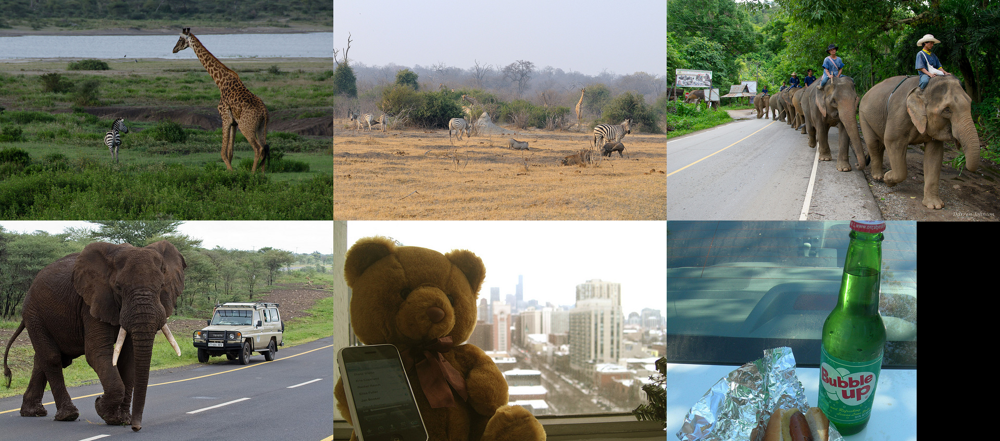

In [4]:
def image_grid(imgs, cols):
    rows = (len(imgs) + cols - 1) // cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

grid = image_grid(images, cols=3)
display(grid)

In [9]:
from PIL import Image, ImageDraw
# %% Zero-shot classification
classes = ['giraffe', 'zebra', 'elephant', 'teddybear', 'hotdog']
inputs = processor(text=classes, images=images, return_tensors="pt", padding=True)

# This function simulates adding bounding boxes to images.
def add_bounding_boxes(image):
    # Simulate bounding box coordinates (x_min, y_min, x_max, y_max)
    boxes = [(50, 50, 200, 200), (100, 100, 250, 250)]  # Example boxes
    draw = ImageDraw.Draw(image)
    for box in boxes:
        draw.rectangle(box, outline="red", width=3)
    return image

# Apply bounding boxes to all images
images_with_boxes = [add_bounding_boxes(img.copy()) for img in images]

outputs = model(**inputs)
logits_per_image = outputs.logits_per_image  # this is the image-text similarity score
probs = logits_per_image.softmax(dim=1)  # we can take the softmax to get the label probabilities

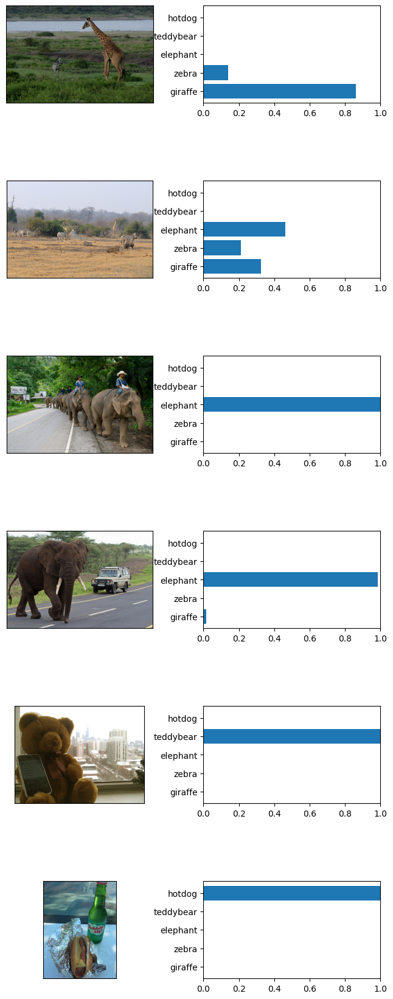

In [6]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8, 20))

for idx in range(len(images)):

    # show original image
    fig.add_subplot(len(images), 2, 2*(idx+1)-1 )
    plt.imshow(images[idx])
    plt.xticks([])
    plt.yticks([])

    # show probabilities
    fig.add_subplot(len(images), 2, 2*(idx+1))
    plt.barh(range(len(probs[0].detach().numpy())),probs[idx].detach().numpy(), tick_label=classes)
    plt.xlim(0,1.0)

    plt.subplots_adjust(left=0.1,
                        bottom=0.1,
                        right=0.9,
                        top=0.9,
                        wspace=0.2,
                        hspace=0.8)

plt.show()

In [15]:
pip install ultralytics opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.0/887.0 kB 14.1 MB/s eta 0:00:00


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 131M/131M [00:01<00:00, 132MB/s]



0: 448x640 1 bird, 1 zebra, 1 giraffe, 3449.2ms
Speed: 18.0ms preprocess, 3449.2ms inference, 21.3ms postprocess per image at shape (1, 3, 448, 640)


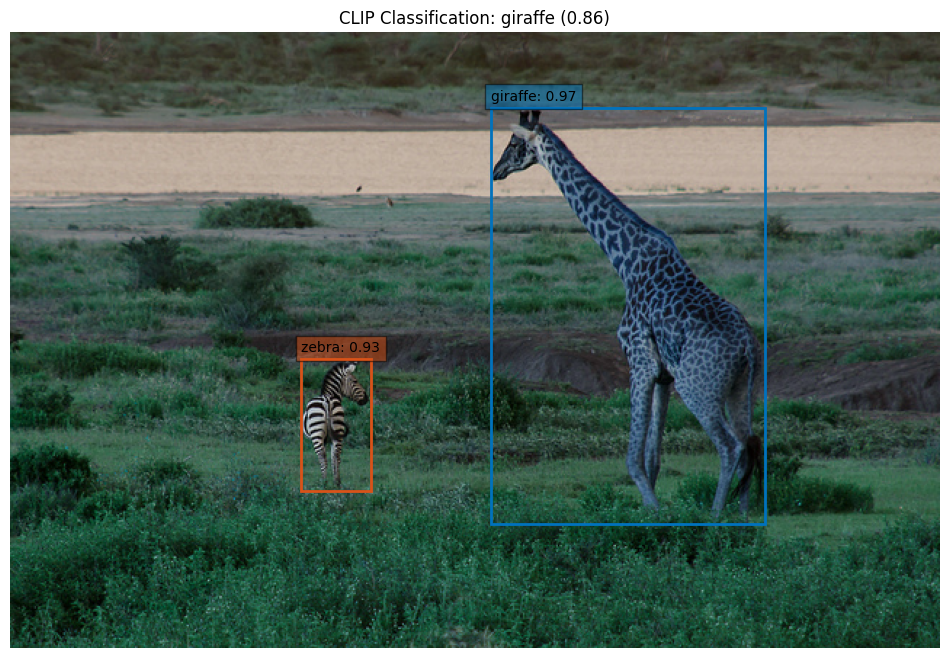


0: 448x640 5 zebras, 2 giraffes, 5026.9ms
Speed: 2.6ms preprocess, 5026.9ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


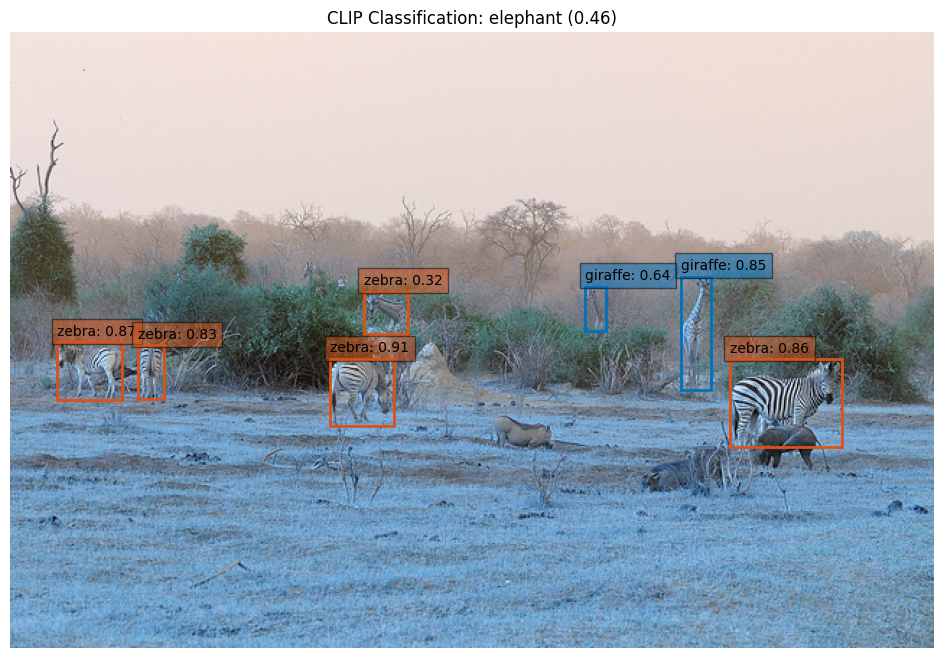


0: 448x640 6 persons, 8 elephants, 3275.3ms
Speed: 2.5ms preprocess, 3275.3ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


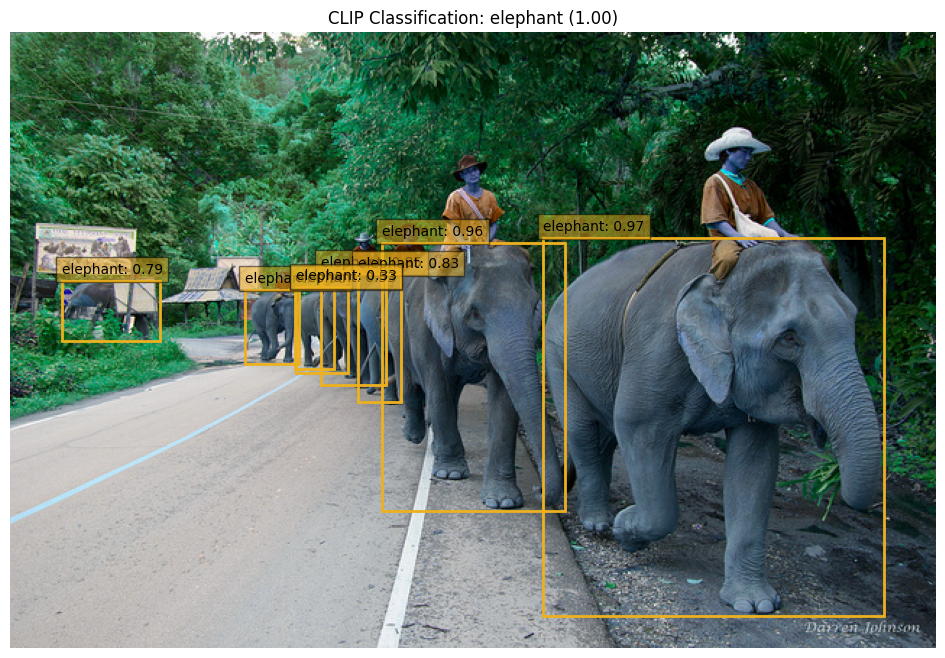


0: 448x640 1 truck, 1 elephant, 3324.8ms
Speed: 2.4ms preprocess, 3324.8ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


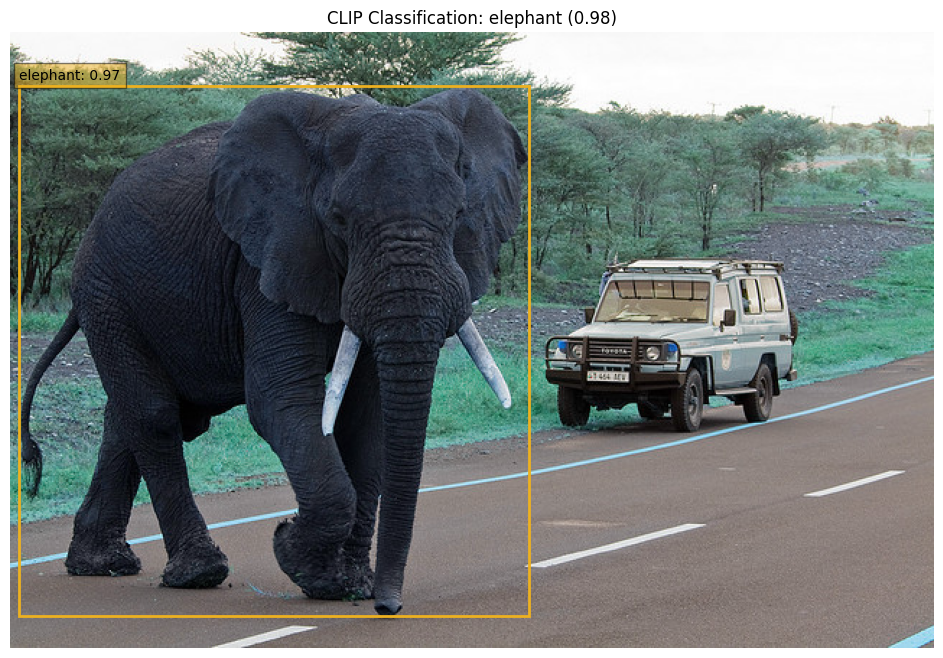


0: 480x640 1 cell phone, 1 teddy bear, 5255.6ms
Speed: 11.8ms preprocess, 5255.6ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


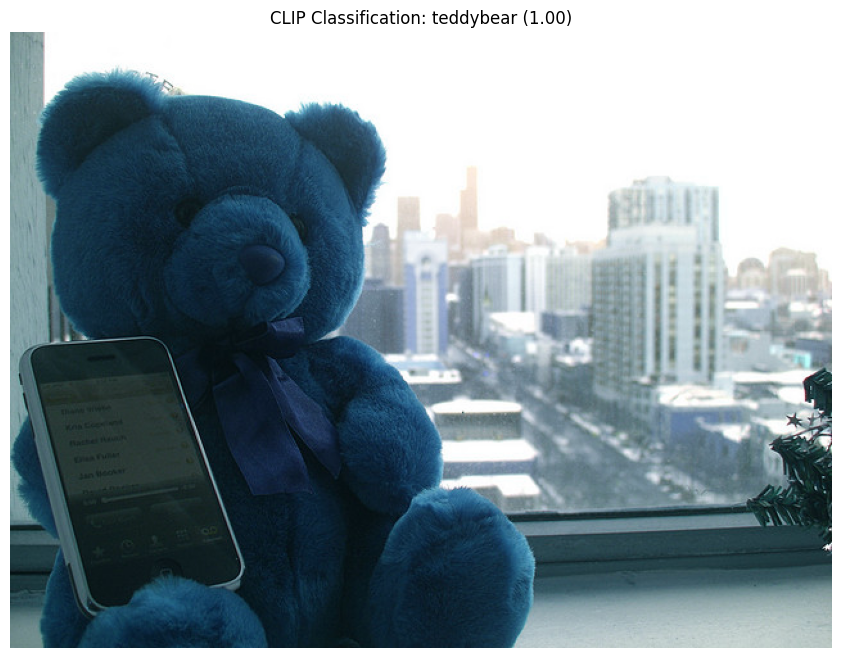


0: 640x480 1 car, 1 bottle, 1 hot dog, 1 dining table, 3512.6ms
Speed: 2.4ms preprocess, 3512.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


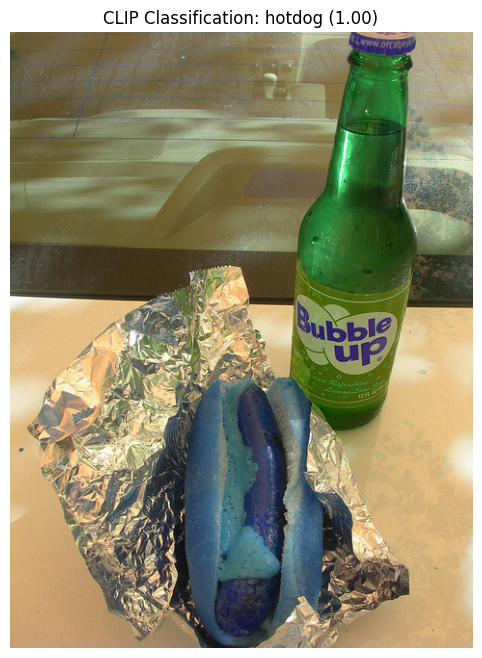

In [16]:
from PIL import Image
import requests
import torch
from transformers import CLIPProcessor, CLIPModel
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO
import numpy as np
import cv2

# Load CLIP model for classification
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Load YOLOv8 model
yolo_model = YOLO('yolov8x.pt')  # Using YOLOv8x for better accuracy

# Load images
image_urls = [
    'http://images.cocodataset.org/val2014/COCO_val2014_000000159977.jpg',
    'http://images.cocodataset.org/val2014/COCO_val2014_000000311295.jpg',
    'http://images.cocodataset.org/val2014/COCO_val2014_000000457834.jpg',
    'http://images.cocodataset.org/val2014/COCO_val2014_000000555472.jpg',
    'http://images.cocodataset.org/val2014/COCO_val2014_000000174070.jpg',
    'http://images.cocodataset.org/val2014/COCO_val2014_000000460929.jpg'
]

def download_image(url):
    return Image.open(requests.get(url, stream=True).raw)

def plot_detections(image, yolo_results, clip_probs, classes, conf_threshold=0.3):
    # Convert PIL Image to numpy array for OpenCV
    image_np = np.array(image)
    if image_np.shape[-1] == 4:  # If RGBA, convert to RGB
        image_np = cv2.cvtColor(image_np, cv2.COLOR_RGBA2RGB)

    # Get CLIP classification result
    clip_class = classes[clip_probs.argmax()]
    clip_confidence = clip_probs.max().item()

    # Create figure and axes
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR))

    # Colors for different classes
    color_map = {
        'giraffe': (0.000, 0.447, 0.741),
        'zebra': (0.850, 0.325, 0.098),
        'elephant': (0.929, 0.694, 0.125),
        'bear': (0.494, 0.184, 0.556),
        'dog': (0.466, 0.674, 0.188),
        'cat': (0.301, 0.745, 0.933)
    }

    if yolo_results:
        boxes = yolo_results[0].boxes
        for box in boxes:
            # Get box coordinates
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf[0].cpu().numpy()
            cls = box.cls[0].cpu().numpy()
            class_name = yolo_model.names[int(cls)]

            # Only show animal detections with confidence above threshold
            if conf > conf_threshold and class_name in ['giraffe', 'zebra', 'elephant', 'bear', 'dog', 'cat']:
                # Create rectangle
                color = color_map.get(class_name, (0.7, 0.7, 0.7))  # Default gray if class not in color_map
                rect = patches.Rectangle(
                    (x1, y1),
                    x2 - x1,
                    y2 - y1,
                    linewidth=2,
                    edgecolor=color,
                    facecolor='none'
                )
                ax.add_patch(rect)

                # Add label with confidence
                label = f'{class_name}: {conf:.2f}'
                ax.text(
                    x1, y1 - 5,
                    label,
                    fontsize=10,
                    bbox=dict(facecolor=color, alpha=0.5)
                )

    plt.title(f'CLIP Classification: {clip_class} ({clip_confidence:.2f})')
    plt.axis('off')
    return fig

# Process images
images = []
for url in image_urls:
    images.append(download_image(url))

# CLIP classification
classes = ['giraffe', 'zebra', 'elephant', 'teddybear', 'hotdog']
clip_inputs = clip_processor(text=classes, images=images, return_tensors="pt", padding=True)
clip_outputs = clip_model(**clip_inputs)
logits_per_image = clip_outputs.logits_per_image
probs = logits_per_image.softmax(dim=1)

# Process each image with both models
for idx, image in enumerate(images):
    # YOLO detection
    results = yolo_model(image)

    # Create visualization
    fig = plot_detections(
        image,
        results,
        probs[idx].detach(),
        classes
    )
    plt.show()
    plt.close()